# Look into worst traces

In [1]:
import pickle
import sys
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
from tqdm.auto import tqdm
import os
import pandas as pd
import datetime
import matplotlib.ticker as ticker
sys.path.append("../../")
sys.path.append("../../covid19_inference")
sys.path.append("../")

import covid19_soccer
from covid19_soccer.plot.utils import get_from_trace
import covid19_inference as cov19
from header_plotting import *

In [3]:
%load_ext autoreload
%autoreload 2

## Load data

In [2]:
def load(fstr):
    with open(fstr, "rb") as f:
         return pickle.load(f)

countries = ['England', 'Czechia', 'Scotland', 'Spain', 'Italy', 'Slovakia',
       'Germany', 'Austria', 'Belgium', 'France', 'Portugal']
       #'Netherlands']

traces, models, dls = [], [], []
for country in tqdm(countries):
    #'UEFA-beta=False-country=England-offset_games=0-draw_delay=True-weighted_alpha_prior=0-prior_delay=-1-width_delay_prior=0.1-sigma_incubation=-1.0-median_width_delay=1.0-tune=200-draws=300-max_treedepth=10.pickled'
    model = None
    fstr=lambda tune, draws, max_treedepth: (f"/data.nst/smohr/covid19_soccer_data/main_traces/run"+
        f"-beta=False"+
        f"-country={country}"+
        f"-offset_data=0"+
        f"-prior_delay=-1"+
        f"-median_width_delay=1.0"+
        f"-interval_cps=10.0"+
        f"-f_fem=0.33"+
        f"-len=normal"+
        f"-abs_sine=False"+
        f"-t={tune}"+
        f"-d={draws}"+
        f"-max_treedepth={max_treedepth}.pkl")
    #print(fstr(4000, 8000, 12))
    if os.path.exists(fstr(4000, 8000, 12)):
        try:
            model, trace = load(fstr(4000, 8000, 12))
            print(f"Use 8000 sample runs for {country}")
        except:
            pass
    if model is None and os.path.exists(fstr(2000, 4000, 12)):
        try:
            model, trace = load(fstr(2000, 4000, 12))
            print(f"Use 4000 sample runs for {country}")
        except:
            pass
    if model is None and os.path.exists(fstr(1000, 1500, 12)):
        try: 
            model, trace = load(fstr(1000, 1500, 12))
            print(f"Use 1500 sample runs for {country}")
        except:
            pass
    if model is None:
        print(" not found")
        continue
    
    # Remove chains with likelihood larger than -200, should only be the case for 2 chains in France
    mask = (np.mean(trace.sample_stats.lp, axis=1)>-200)
    trace.posterior = trace.posterior.sel(chain=~mask)
    
    dl = covid19_soccer.dataloader.Dataloader_gender(countries=[country])
    models.append(model)
    traces.append(trace)
    dls.append(dl)

  0%|          | 0/11 [00:00<?, ?it/s]

Use 4000 sample runs for England
Use 4000 sample runs for Czechia
Use 4000 sample runs for Scotland
Use 4000 sample runs for Spain
Use 4000 sample runs for Italy
Use 4000 sample runs for Slovakia
Use 4000 sample runs for Germany
Use 4000 sample runs for Austria
Use 4000 sample runs for Belgium
Use 4000 sample runs for France
Use 4000 sample runs for Portugal


## Compute rhat

In [71]:
from multiprocessing import Pool
import arviz as az

def get_max_rhat(country, trace):
    return az.rhat(trace)
    
rhats = []
    
with Pool(processes=6) as pool:
    results = []
    for i, country in enumerate(countries):
        trace = traces[i]    
        result = pool.apply_async(get_max_rhat, (country, trace)) 
        results.append(result)
    for res in results:
        rhats.append(res.get())


/data.nst/smohr/anaconda3/envs/pymc3_new/lib/python3.8/site-packages/arviz/stats/diagnostics.py:561: RuntimeWarning: invalid value encountered in double_scalars
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/data.nst/smohr/anaconda3/envs/pymc3_new/lib/python3.8/site-packages/arviz/stats/diagnostics.py:561: RuntimeWarning: invalid value encountered in double_scalars
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/data.nst/smohr/anaconda3/envs/pymc3_new/lib/python3.8/site-packages/arviz/stats/diagnostics.py:561: RuntimeWarning: invalid value encountered in double_scalars
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/data.nst/smohr/anaconda3/envs/pymc3_new/lib/python3.8/site-packages/arviz/stats/diagnostics.py:561: RuntimeWarning: invalid value encountered in double_scalars
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/data.nst/smohr/

In [251]:
def plot_trace(var, trace, ax, index=0):
    """ Utils function to plot a trace
    
    Parameters
    ----------
    var: sring
        Variable name in trace
    trace: arviz.InferenceData
        Trace
    ax: mpl.axes
        Matplotlib axes
    """
    samples = trace.posterior[var] # dims, chain, samples, ...
    
    colors_chain = cmap = mpl.cm.get_cmap('tab10')
    
    # Iterate all chains
    for c in range(samples.shape[0]):
        if index is None:
            ax.plot(samples[c,:],label=f"Chain {c+1}",color=colors_chain(c/10),lw=0.5)
        elif len(index)==2:
            ax.plot(samples[c,:,index[0],index[1]],label=f"Chain {c+1}",color=colors_chain(c/10),lw=0.5)
        elif len(index)==1:
            ax.plot(samples[c,:,index[0]],label=f"Chain {c+1}",color=colors_chain(c/10),lw=0.5)
    # Markup
    ax.set_xlim(0,samples.shape[1])
    ax.set_ylabel(var+"\n"+str(index))
    ax.set_xlabel("Draws")
    return ax

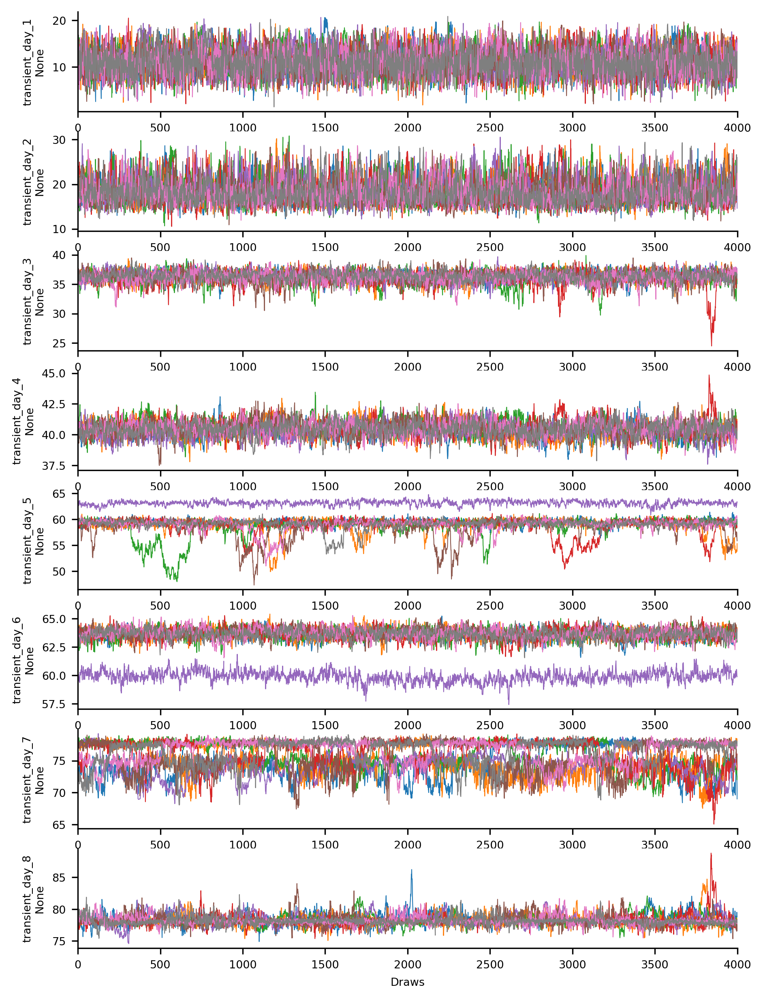

In [252]:
fig,ax = plt.subplots(8,1,figsize=(7,10))
for i in range(8):
    plot_trace(f"transient_day_{i+1}",traces[0],index=None,ax=ax[i])
    
plt.show()

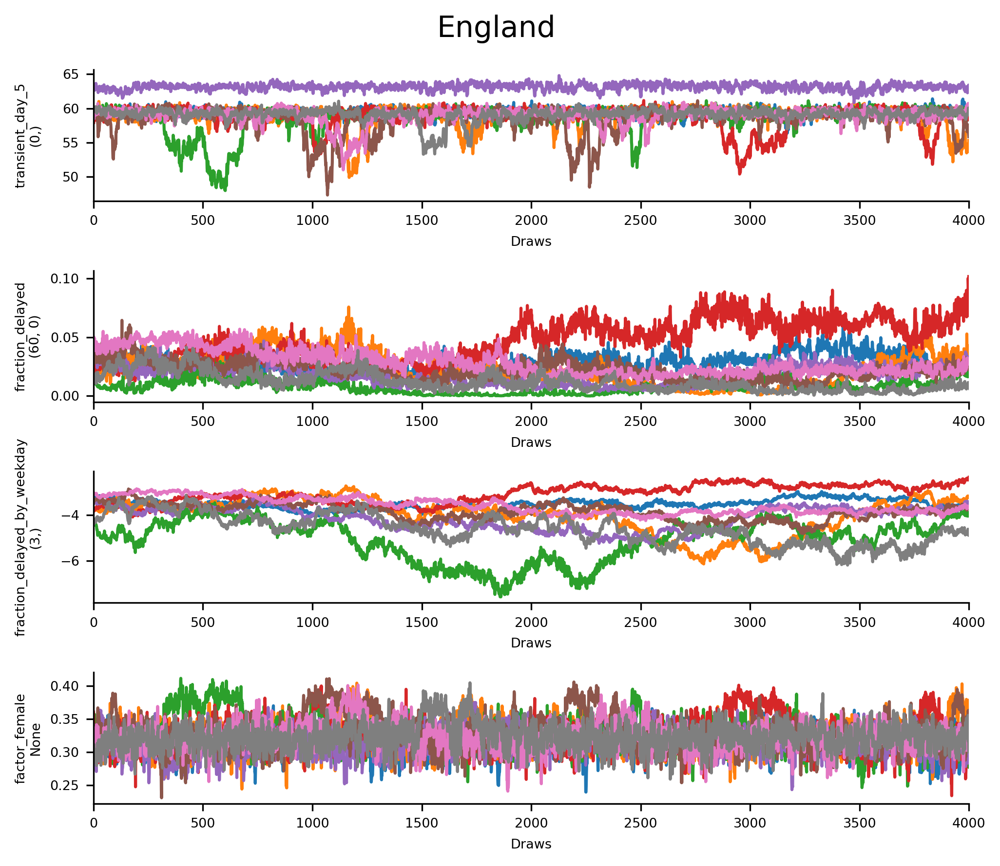

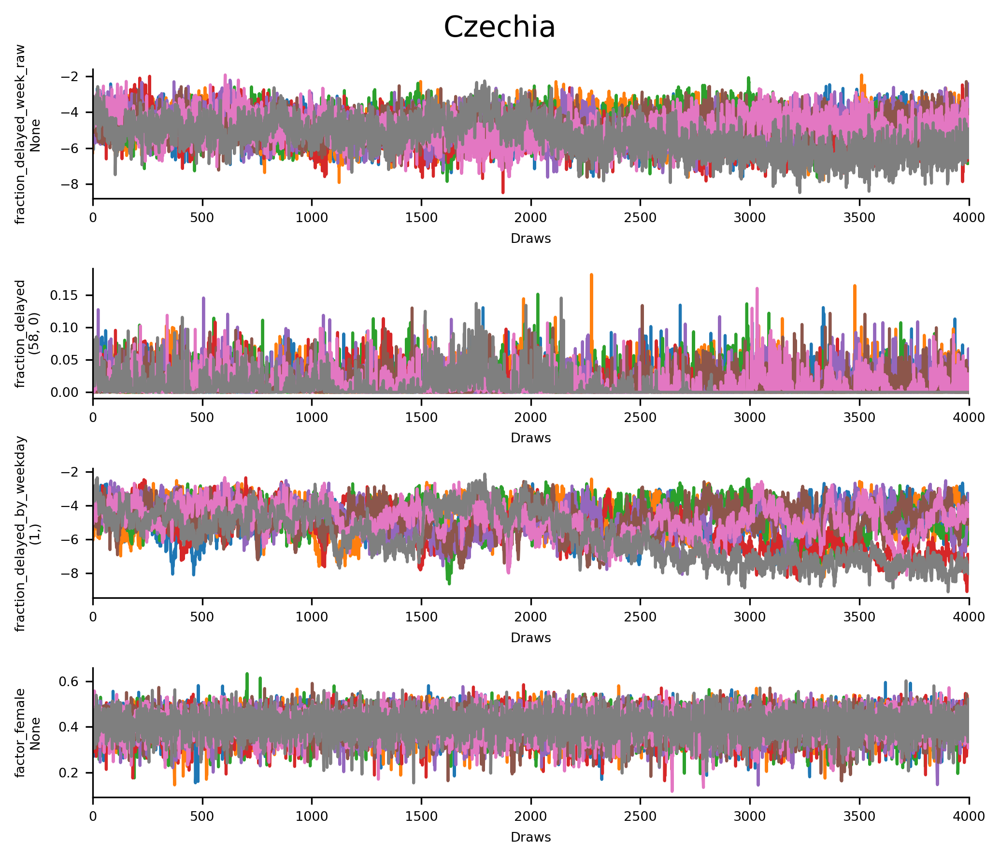

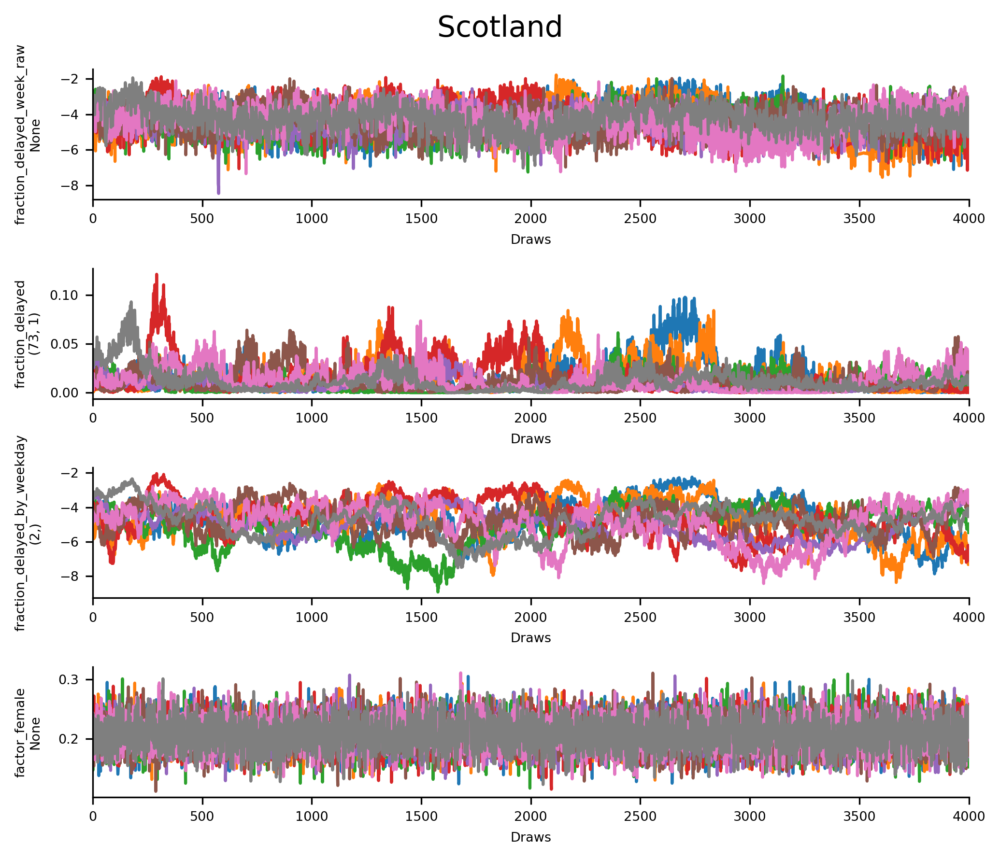

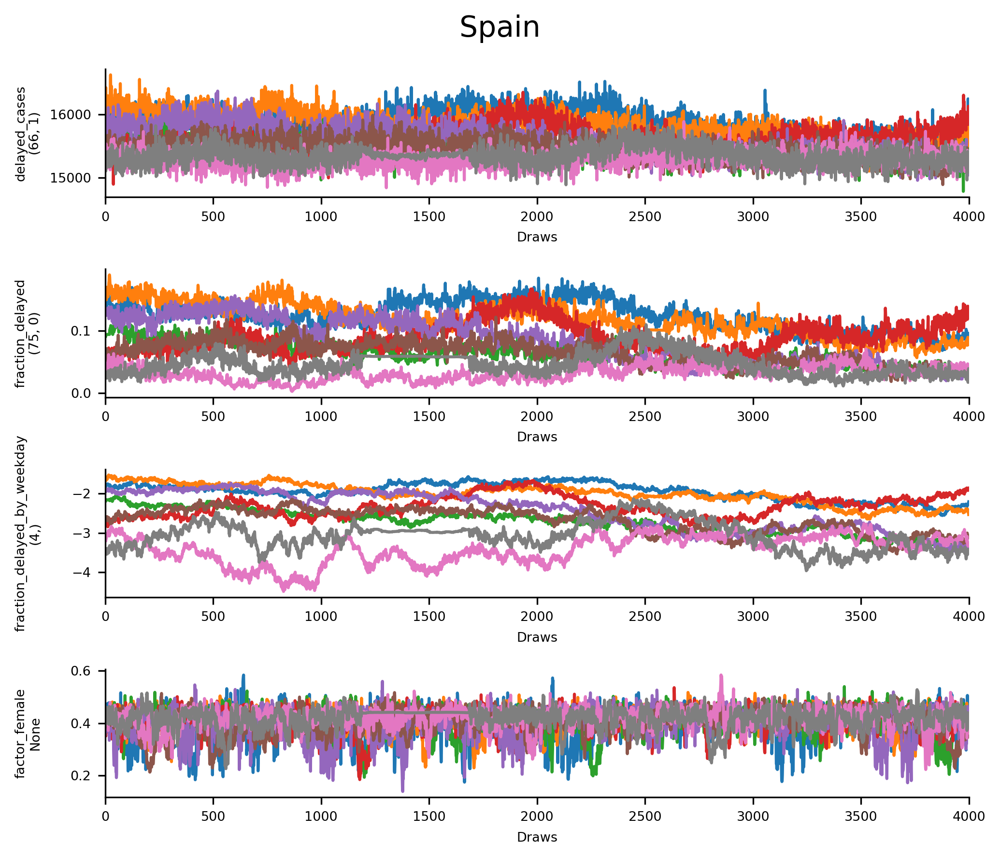

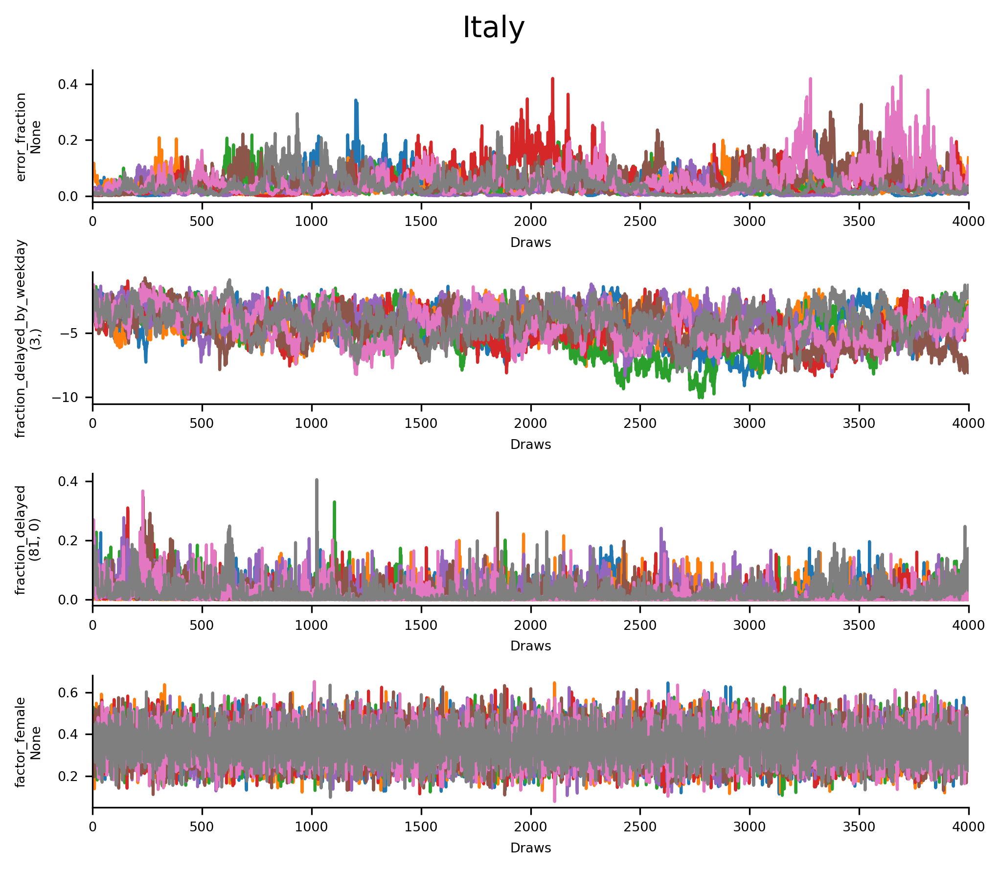

...

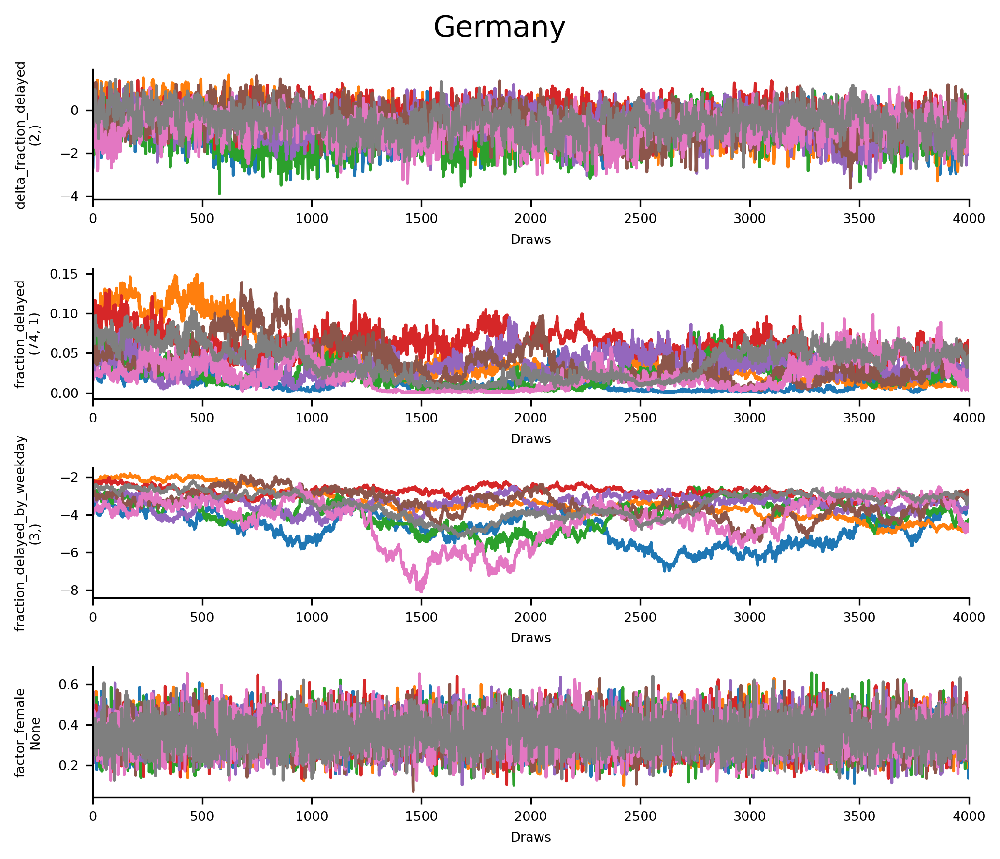

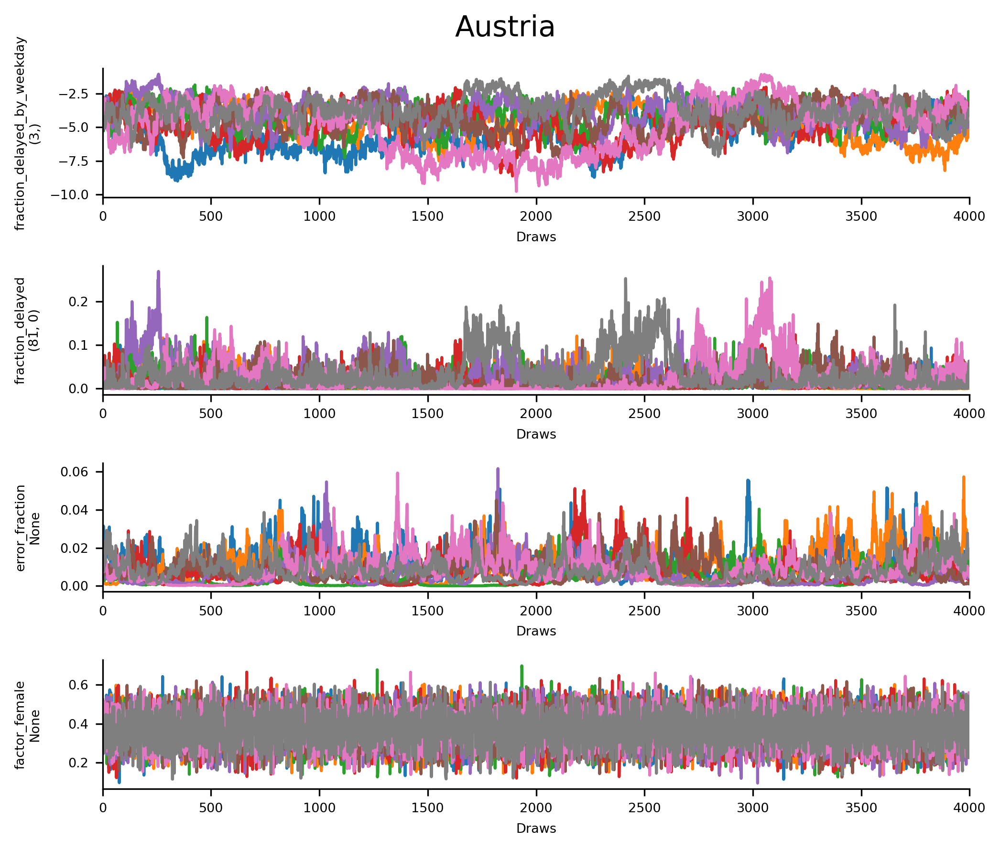

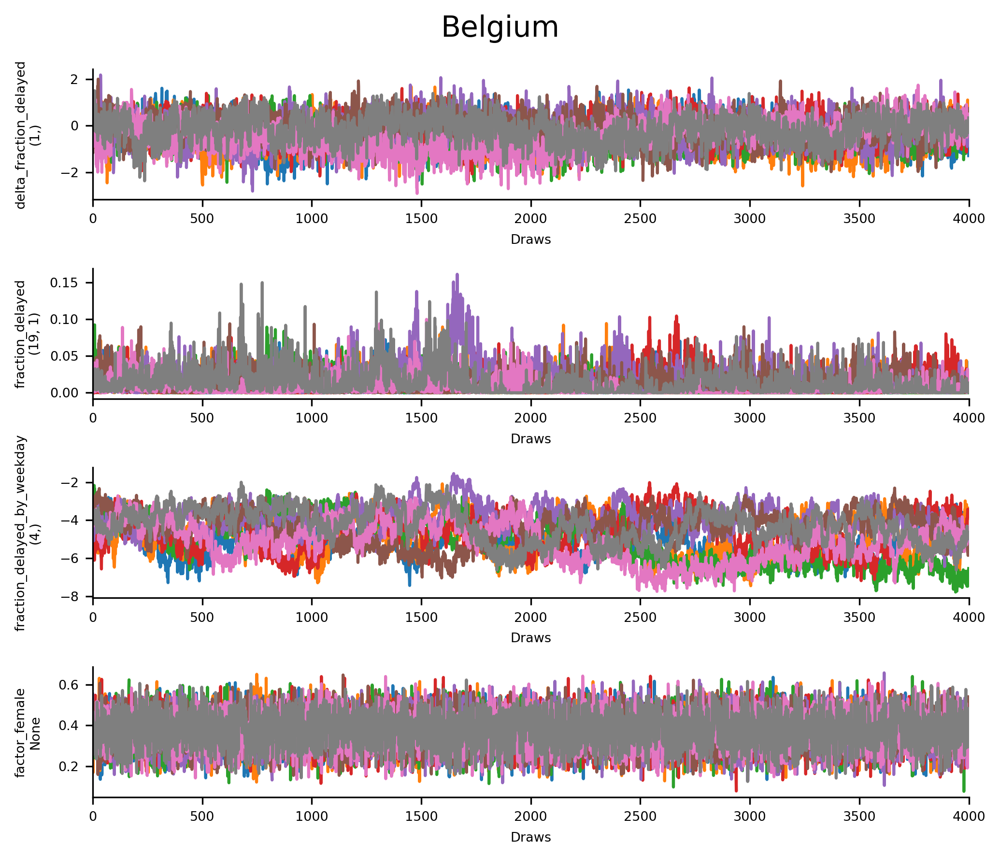

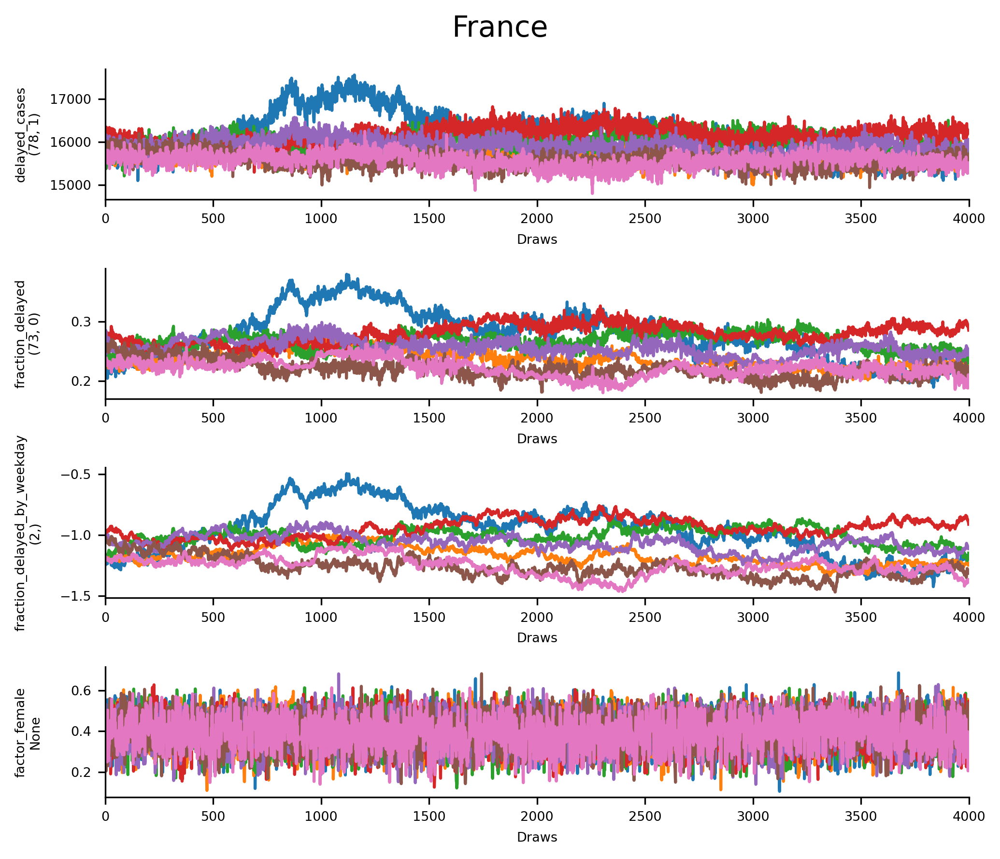

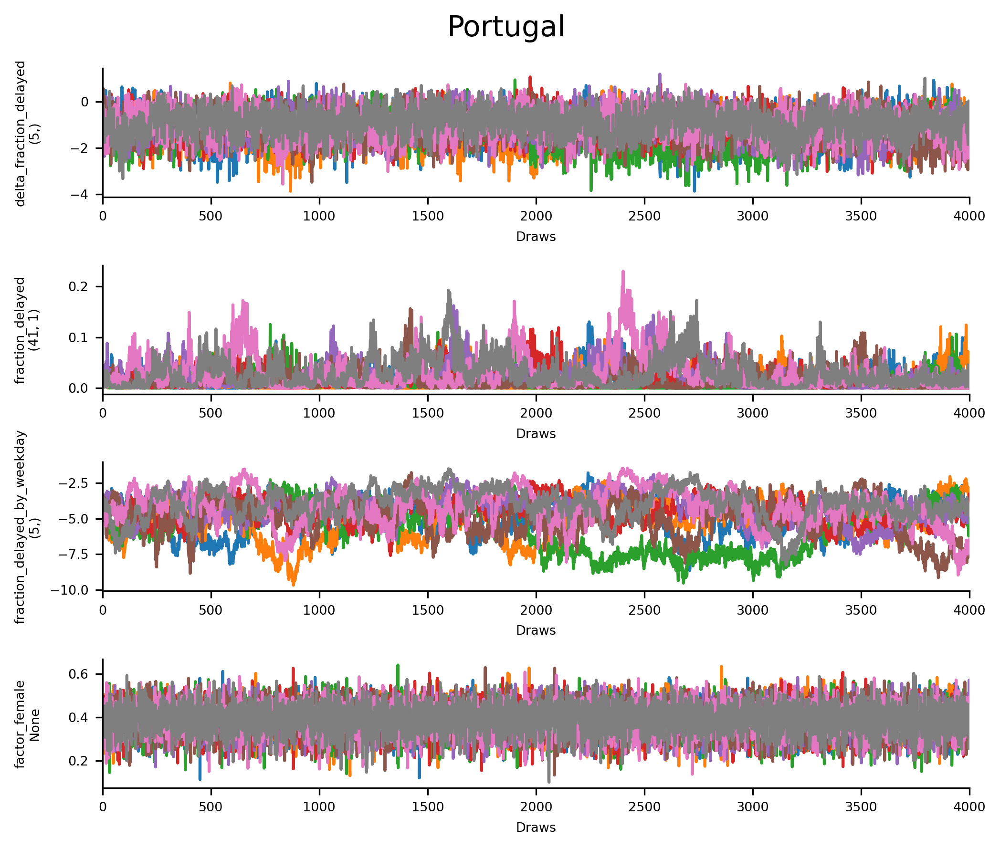

In [246]:
for i, country in enumerate(countries):
    rhat_max = rhats[i].max()
    values = []
    for var in rhats[i].data_vars:
        values.append(rhat_max[var].values)

    # Get three biggest
    arg_three = np.argsort(values)[-3:]
    worst_vars = np.array(rhats[i].data_vars)[arg_three].tolist()
    
    
    # Add omega to worst vars for comparison
    worst_vars.append("factor_female")

    # Now we get the index of the max values
    fig, axes = plt.subplots(len(worst_vars),1,figsize=(7,len(worst_vars)*1.5))
    for var, ax in zip(worst_vars,axes):
        vals = rhats[i][var].to_numpy()
        if vals.ndim >= 1:
            index = np.unravel_index(np.argmax(vals),vals.shape)
        else:
            index = None
        plot_trace(var,traces[i],ax,index)

    fig.align_ylabels(axes)
    fig.suptitle(countries[i],fontsize="x-large")
    fig.tight_layout()
    plt.show()

In [253]:
import covid19_inference.plot as cov19plot



In [254]:
cov19plot.timeseries_overview

<module 'covid19_inference.plot' from '/home/smohr/Repositories/covid19_soccer/notebooks/supplementary/../../covid19_inference/covid19_inference/plot.py'>